<a href="https://colab.research.google.com/github/piglesias98/VisionPorComputador/blob/master/practica3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Práctica 3

## Librerías necesarias

In [0]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import copy
import math
import random

## Imágenes

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
path = "/content/drive/My Drive/VC/imagenes"

## Funciones auxiliares

Función para pintar las imágenes

In [0]:

#Función que representa las imágenes de un array en las columnas y el tamaño que se le indique
def representar_imagenes(lista_imagen_leida, lista_titulos, n_col=2, tam=15):

	# Comprobamos que el numero de imágenes corresponde con el número de títulos pasados
	if len(lista_imagen_leida) != len(lista_titulos):
		print("No hay el mismo número de imágenes que de títulos.")
		return -1 # No hay el mismo numero de imágenes que de títulos

	# Calculamos el numero de imagenes
	n_imagenes = len(lista_imagen_leida)

	# Calculamos el número de filas
	n_filas = (n_imagenes // n_col) + (n_imagenes % n_col)

	# Establecemos por defecto un tamaño a las imágenes
	plt.figure(figsize=(tam,tam))

	# Recorremos la lista de imágenes
	for i in range(0, n_imagenes):

		plt.subplot(n_filas, n_col, i+1) # plt.subplot empieza en 1

		if (len(np.shape(lista_imagen_leida[i]))) == 2: # Si la imagen es en gris
			plt.imshow(lista_imagen_leida[i], cmap = 'gray')
		else: # Si la imagen es en color
			plt.imshow(cv2.cvtColor(lista_imagen_leida[i], cv2.COLOR_BGR2RGB))

		plt.title(lista_titulos[i]) # Añadimos el título a cada imagen

		plt.xticks([]), plt.yticks([]) # Para ocultar los valores de tick en los ejes X e Y

	plt.show()

## Ejercicio 1 Puntos de Harris

### Funciones auxiliares

Función que genera una pirámide gaussiana obtenida de la práctica 1.
Para que las imágenes sean del mismo tamaño usamos pyrup



In [0]:
def piramide_gaussiana(im, n=4):
  # Se crea la lista donde se alojan las imágenes
  imagenes = list()
  # Se añade la imagen original a la lista
  imagenes.append(im)
  for i in range(n):
    imagenes.append(cv2.pyrUp(cv2.pyrDown(imagenes[i])))
    # En lugar de dejar las imágenes pequeñas las ponemos en el tamaño original con pyrup
  return imagenes

Función que realiza un alisamiento gaussiano
- convolucion --> realiza una convolución de kernel x kernely sobre la imagen
- gaussiana --> aplica un filtro gaussiano a la imagen

In [0]:
def convolucion(imagen, kernelx, kernely, border=cv2.BORDER_DEFAULT, normalize=True):
    kernelx = np.flip(kernelx)
    kernely= np.flip(kernely)
    img = np.copy(imagen)
    height, width = imagen.shape[:]
    for i in range(height):
        resConv = cv2.filter2D(img[i, :], -1, kernelx, border)
        img[i, :] = [sublist[0] for sublist in resConv]
    for j in range(width):
        resConv = cv2.filter2D(img[:, j], -1, kernely, border)
        img[:, j] = [sublist[0] for sublist in resConv]
    if normalize:
        cv2.normalize(img, img, 0, 255, cv2.NORM_MINMAX)
    return img

#Función que aplica un filtro gaussiano de un sigma dado a la imagen
def gaussiana(imagen, sigma, borde=cv2.BORDER_DEFAULT):
    img = np.copy(imagen)
    tam = 6*sigma +1
    kernel = cv2.getGaussianKernel(tam, sigma)
    imgConv = convolucion(img, kernel, kernel, borde)
    return imgConv

### Obtención de Puntos Harris

**Función que calcula el criterio de Harris**

Si se quiere obtener los puntos Harris de una imagen utilizando el operador Harris, es necesario seguir un criterio. En este caso se hará uso de los autovalores de M (l1, l2) y de la constante k.
El criterio es: l1*l2 - k * (l1+l2)^2

In [0]:
def criterio_harris(l1, l2, k = 0.04):
  # Se devuelve el valor dado siguiendo el criterio
  return ((l1*l2) - (k*((l1+l2)*(l1+l2))))

**Detector de esquinas de Harris**

In [0]:
def detector_esquinas(imagen, block_size, k_size, k = 0.04):
  # Se calculan los autovalores y los autovectores de la imagen
    vals_and_vecs = cv2.cornerEigenValsAndVecs(imagen, block_size, k_size)
    vals_and_vecs = cv2.split(vals_and_vecs)
    l1 = vals_and_vecs[0]
    l2 = vals_and_vecs[1]
    harris = criterio_harris(l1, l2, k)
    return harris

Función para probar qué devuelve el detector de esquinas implementado  comparado con la función propia de OpenCV


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


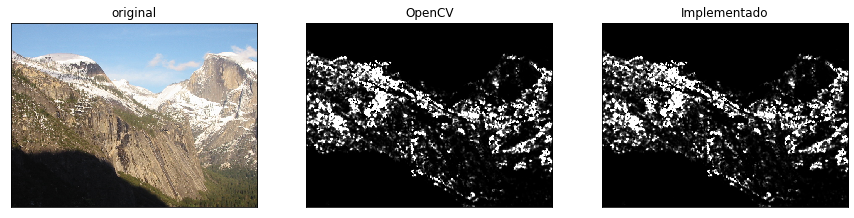

In [11]:
def prueba_detector_esquinas():
  img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
  #La imagen debe estar en escala de grises para que la puedan procesar los detectores
  img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  
  esquinas = detector_esquinas(img_gris, 5, 7) #MEJOR 5 Y 7
  esquinasMergeado = cv2.merge([esquinas, esquinas, esquinas])
  #plt.imshow(esquinasMergeado)
  opencv = cv2.cornerHarris(img_gris,5, 7, 0.04)
  opencvmerge = cv2.merge([opencv, opencv, opencv])
  representar_imagenes([img, esquinasMergeado, opencvmerge], ["original", "OpenCV", "Implementado"],3)

### Supresión de No Máximos

**Función que calcula la supresión de no máximos**

Para calcular la supresión de no máximos necesitaremos una matriz de valores=0 (negra). 
Pasearemos una ventana de tamaño impar para tener un valor central por la matriz de los valores Harris. 
- Si el elemento central de la matriz es el máximo local en la ventana --> todos los valores de la ventana serán 0 menos el central que será 255
- Si el elemento no es máximo local --> se pondrá a 0 (él solo)

Definiremos un umbral de 0.05


Suprime los valores no-máximos de una matriz (harris). Elimina los puntos que, aunque tengan un valor alto de criterio Harris, no son máximos locales de su entorno (env) para un tamaño de entorno prefijado.
Permite la utilización de un umbral (threshold) para eliminar aquellos puntos Harris que se consideren elevados.
Devuelve una lista con los keyPoints y su valor correspondiente.

Función auxiliar: maximo local, para determinar si el elemento central de la ventana es 0

In [0]:
def maximo_local(data):
    # Calculamos la dimensión de la matriz recibida
    shape = data.shape
    # Se calcula el centro de los datos
    center = data[round(shape[0]/2)-1, round(shape[0]/2)-1]
    # Se devuelve si el centro es el máximo o no
    return center == np.max(data)

Función auxiliar: modificar ceros --> pone a 0 una región cuadrada de una matriz

In [0]:
def modificar_ceros(matriz, filas, columnas, tam):
  matriz[filas-int(tam/2):(filas+1)+int(tam/2), columnas-int(tam/2):(columnas+1)+int(tam/2)]=0

Supresión de no máximos

In [0]:
def supresion_no_maximos(imagen, tam, umbral):
  print(imagen.shape)
  img = copy.deepcopy(imagen)
  pos_inicial = int(tam/2)
  pos_final_filas = imagen.shape[0] - pos_inicial
  pos_final_columnas = imagen.shape[1] - pos_inicial
  #Creamos una matriz del mismo tamaño que la original en negro
  negro = np.zeros((imagen.shape[0], imagen.shape[1]))
  for i in range(pos_inicial, pos_final_filas):
    for j in range(pos_inicial, pos_final_columnas):
      ventana = img[i-pos_inicial:(i+1)+pos_inicial, j-pos_inicial:(j+1)+pos_inicial]
      if (maximo_local(ventana) and np.amax(ventana)>umbral):
        modificar_ceros(negro, i, j, tam)
        negro[i][j] = 255 #el máximo local será blanco
  return negro  

Función para probar la diferencia entre la imagen sin supresión y con supresión de los puntos de Harris

(480, 640)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


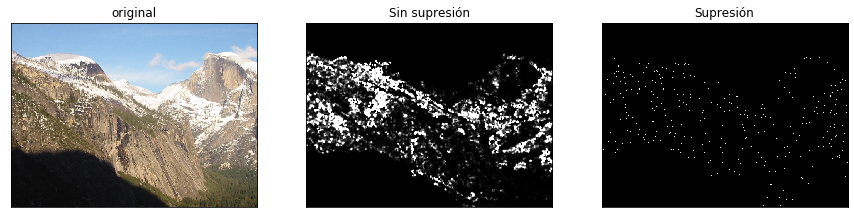

In [15]:
def prueba_supresion():
  img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
  #La imagen debe estar en escala de grises para que la puedan procesar los detectores
  img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  
  esquinas = detector_esquinas(img_gris, 5, 7) #MEJOR 5 Y 7
  esquinasMergeado = cv2.merge([esquinas, esquinas, esquinas])
  maximos = supresion_no_maximos(esquinas, 5, 0.05)
  representar_imagenes([img, esquinasMergeado, maximos], ["original",  "Sin supresión", "Supresión"],3)

Función que prueba la extracción de puntos Harris y la supresión de no máximos en todos los niveles de la pirámide

(480, 640)
(480, 640)
(480, 640)
(480, 640)
(480, 640)


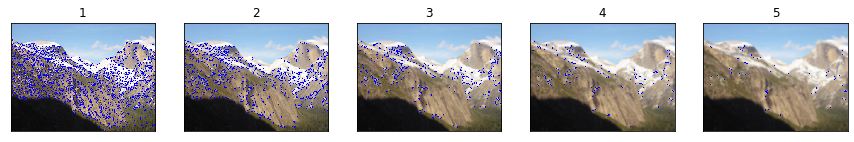

In [16]:
def prueba_supresion_piramide():
  img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
  #La imagen debe estar en escala de grises para que la puedan procesar los detectores
  img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  piramide_color =  piramide_gaussiana(img)
  piramide_gris = piramide_gaussiana(img_gris)
  for escala in range(len(piramide_gris)):
    harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
    supresion = supresion_no_maximos(harris, 5, 0.05)
    for i in range(len(supresion)):
      for j in range(len(supresion[i])):
        if (supresion[i][j]==255):
          cv2.circle(piramide_color[escala], (j,i), 1, (255,0,0), 2)
  representar_imagenes(piramide_color, ["1",  "2", "3", "4", "5"], 5)

### Obtención de Keypoints




Función que por cada punto extrae una estructura KeyPoint (x, y, escala, orientacion)

Para calcular la orientación primero realiza un fuerte alisamiento de la imagen para después calcular las derivadas.



In [0]:
# Función para crear el vector de keypoints.
def keypoints(imagen, harris, nivel, blocksize):
  img = copy.deepcopy(imagen)
  # vector de keypoints
  kp = []
  #Realizamos un alisamiento fuerte con sigma = 4.5, aproximado sigma = 5
  sigma = 5
  ksize = 3
  img = gaussiana(img, sigma)
  #Calculo las derivadas
  derx = cv2.Sobel(img, cv2.CV_32F,1,0,ksize)
  dery = cv2.Sobel(img, cv2.CV_32F,0,1,ksize)
  #orientaciones = orientaciones(img, harris)
  #Calculo las coordenadas x e y de cada punto
  for i in range(len(harris)):
    for j in range(len(harris[i])):
      if (harris[i][j]==255):
        px = j
        py = i
        angulo = np.arctan2(dery[i,j],derx[i,j])*180/np.pi
        tam = (nivel+1) * blocksize
        #Utilizamos nivel + 1 para que en el caso de la imagen original en la pirámide,
        #en el que la escala es 0, pueda pintar los keypoints
        kp.append(cv2.KeyPoint(x=px,y=py,_angle=angulo ,_size=tam))

  return kp

(480, 640)


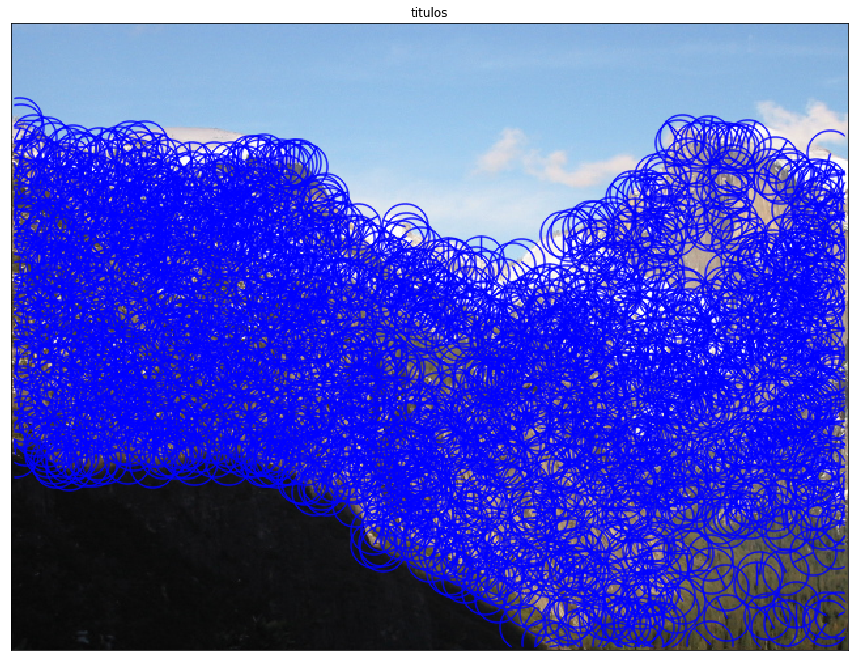

In [18]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
harris = detector_esquinas(img_gris, 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
img_salida = copy.deepcopy(img)
kp = keypoints(img_gris, supresion, escala, 7)
img_salida = cv2.drawKeypoints(img, kp, outImage = img_salida, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255,0,0) )
representar_imagenes([img_salida],["titulos"], 1)

(480, 640)
1608 keypoints
[<KeyPoint 0x7fca1840dab0>, <KeyPoint 0x7fca1840d810>, <KeyPoint 0x7fca1840d870>, <KeyPoint 0x7fca1840d930>, <KeyPoint 0x7fca1840d4e0>, <KeyPoint 0x7fca1840d8d0>, <KeyPoint 0x7fca1840d2a0>, <KeyPoint 0x7fca1840d360>, <KeyPoint 0x7fca1840da80>, <KeyPoint 0x7fca16a041e0>, <KeyPoint 0x7fca16a04240>, <KeyPoint 0x7fca16a04210>, <KeyPoint 0x7fca16a04060>, <KeyPoint 0x7fca16a04180>, <KeyPoint 0x7fca16a041b0>, <KeyPoint 0x7fca16a042a0>, <KeyPoint 0x7fca16a04120>, <KeyPoint 0x7fca16a04270>, <KeyPoint 0x7fca16a042d0>, <KeyPoint 0x7fca16a04300>, <KeyPoint 0x7fca16a04330>, <KeyPoint 0x7fca16a04360>, <KeyPoint 0x7fca16a04390>, <KeyPoint 0x7fca16a043c0>, <KeyPoint 0x7fca16a04150>, <KeyPoint 0x7fca16a043f0>, <KeyPoint 0x7fca16a04450>, <KeyPoint 0x7fca16a04420>, <KeyPoint 0x7fca16a04480>, <KeyPoint 0x7fca16a044b0>, <KeyPoint 0x7fca16a04510>, <KeyPoint 0x7fca16a04540>, <KeyPoint 0x7fca16a044e0>, <KeyPoint 0x7fca16a04570>, <KeyPoint 0x7fca16a045a0>, <KeyPoint 0x7fca16a04600>, <

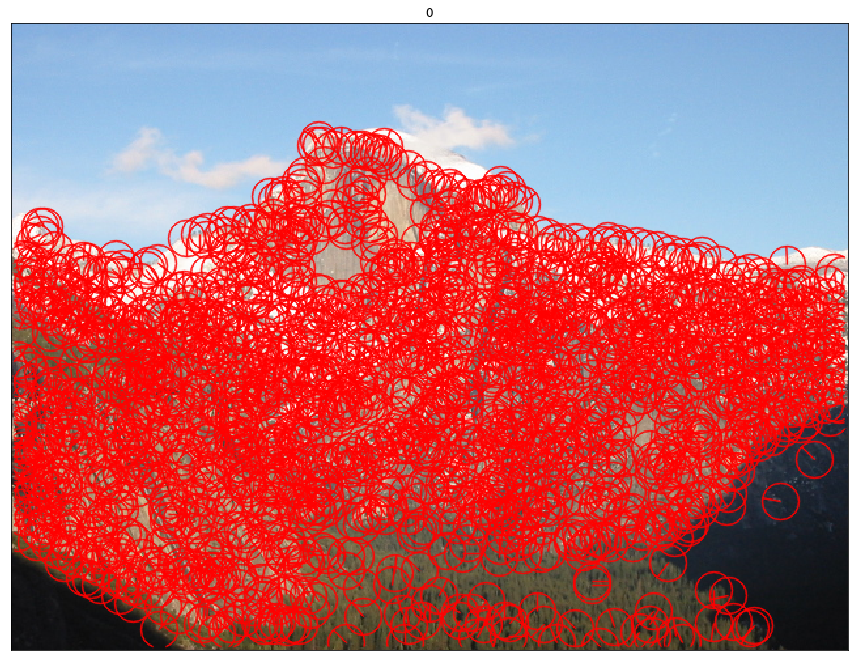

In [19]:
img = cv2.imread(path + '/yosemite/Yosemite2.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
escala = 0
harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
kp = keypoints(piramide_gris[escala], supresion, 3, 7)
print(len(kp),"keypoints")
print(kp)
cv2.drawKeypoints(piramide_color[escala], kp, piramide_color[escala], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0,0,255) )
representar_imagenes([piramide_color[escala]],["0"], 1,15)

0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints


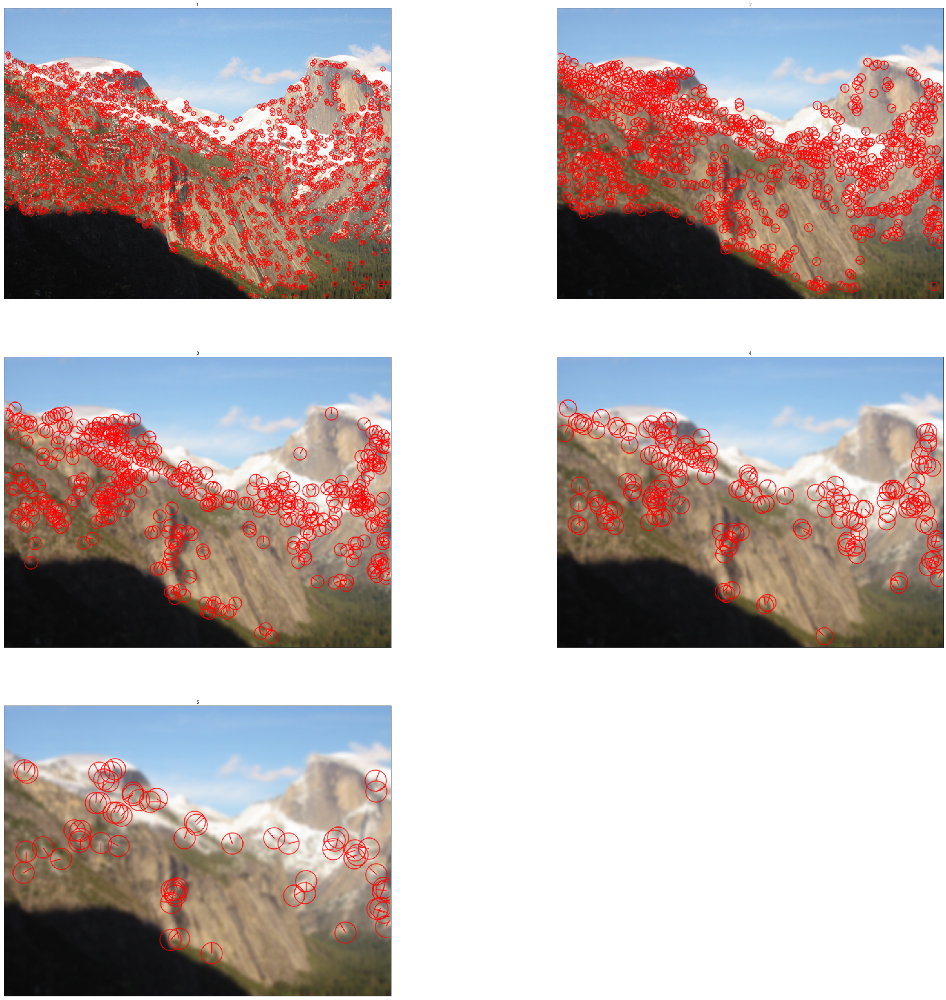

In [20]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
salida = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp = keypoints(piramide_gris[escala], supresion, escala, 7)
  print(len(kp),"keypoints")
  cv2.drawKeypoints(piramide_color[escala], kp, piramide_color[escala], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0,0,255) )
representar_imagenes(piramide_color, ["1",  "2", "3", "4", "5"], 2, 50)


0 ESCALA
(480, 640)
1 keypoints
1 ESCALA
(480, 640)
2 keypoints
2 ESCALA
(480, 640)
3 keypoints
3 ESCALA
(480, 640)
4 keypoints
4 ESCALA
(480, 640)
5 keypoints


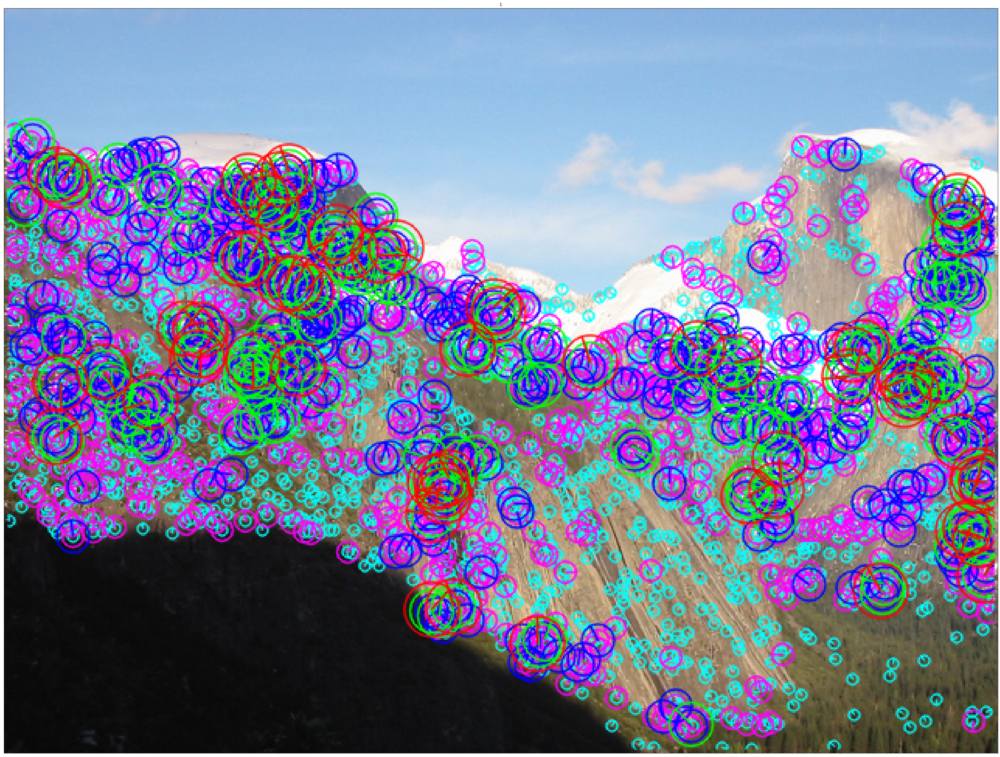

In [21]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp),"keypoints")


colores = [(255,255,0),(255,0,255),(255,0,0),(0,255,0),(0,0,255)]
for i in range(len(kp)):
  cv2.drawKeypoints(piramide_color[0], kp[i], piramide_color[0], flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = colores[i] )

representar_imagenes([piramide_color[0]], ["1"], 1, 50)

Calcular las coordenadas subpixel (x, y) de cada KeyPoint usando la función cornerSubPix de OpenCV y mostrar una imagen interpolada del entorno de las coordenadas (solo un entorno 10x10 a un zoom 5x) de una selección aleatoria de 3 de ellos en donde se marquen las coordenadas originales y las corregidas.

In [22]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp[escala]),"keypoints")

print(len(kp))

flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

print(flat_kp[2999])
print(flat_kp[0].pt[0])
print(flat_kp[0].pt[1])
print(flat_kp[0].angle)
print(flat_kp[0].octave)


0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints
5
3430
<KeyPoint 0x7fca169cd750>
6.0
75.0
0.0
0


In [23]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.05)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp[escala]),"keypoints")

print(len(kp))

flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

nuevas_coord = []
for escala in range(len(piramide_gris)):
  nuevas_coord.append([])
  for punto in flat_kp:
    if (punto.octave==escala):
      nuevas_coord[escala].append(np.array(np.float32([punto.pt[0],punto.pt[1]])))


criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
zerozone = (-1,1)

nuevas_coord = [(cv2.cornerSubPix(piramide_gris[i],
                                  np.array(nuevas_coord[i],
                                  (int(tam/2),int(tam/2)),
                                  zerozone,
                                  criteria)) for i in range(len(piramide_gris)))]
print(nuevas_coord)
nuevos_puntos=[]
for i in range(len(nuevas_coord)):
  for j in range(len(nuevas_coord[i])):
    nuevos_puntos.append((nuevas_coord[i][j][0],
                          nuevas_coord[i][j][1],i))



0 ESCALA
(480, 640)
1784 keypoints
1 ESCALA
(480, 640)
992 keypoints
2 ESCALA
(480, 640)
418 keypoints
3 ESCALA
(480, 640)
173 keypoints
4 ESCALA
(480, 640)
63 keypoints
5
3430
[<generator object <genexpr> at 0x7fca16bafe08>]


TypeError: ignored

In [24]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
harris = detector_esquinas(img_gris, 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
kp=keypoints(img_gris, supresion, escala, 7)
print(len(kp))

cv2.drawKeypoints(img, kp, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
representar_imagenes([img1], ["1"],1, 15)






flat_kp = []
for sublist in kp:
    for item in sublist:
        flat_kp.append(item)

print(len(flat_kp))

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)

nuevos = list()
index = list()

nuevo_kp = flat_kp

for i, punto in enumerate(flat_kp):
  if (punto.octave == escala):
    nuevos.append(punto.pt)
    index.append(i)

nuevos = np.float32(nuevos)
zerozone = (-1,1)
cv2.cornerSubPix(img_gris, nuevos, (5,5), zerozone, criteria )

for i, punto in enumerate(nuevos_puntos):
  nuevo_kp[index[i]].pt = (punto[0],punto[1])

print(flat_kp)
print(nuevo_kp)
img1 = copy.deepcopy(img)
img2 = copy.deepcopy(img)
cv2.drawKeypoints(img1, kp[0], img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
cv2.drawKeypoints(img2, nuevo_kp, img2, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (255,0,0) )
#representar_imagenes([img1, img2], ["1", "2"], 2, 15)

(480, 640)
1784


NameError: ignored

(480, 640)
1784
311 x original
225 y original
311.23148 x nuevo
226.67577 y nuevo

306 ,  317
220 ,  231


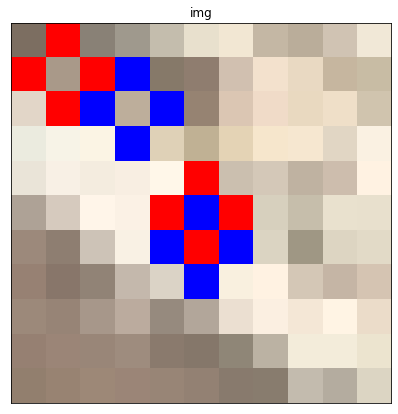

In [102]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
#La imagen debe estar en escala de grises para que la puedan procesar los detectores
img_gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
'''
piramide_color =  piramide_gaussiana(img)
piramide_gris = piramide_gaussiana(img_gris)
kp = []
for escala in range(len(piramide_gris)):
  print(escala, "ESCALA")
  harris = detector_esquinas(piramide_gris[escala], 5, 7, 0.04)
  supresion = supresion_no_maximos(harris, 5, 0.7)
  kp.append(keypoints(piramide_gris[escala], supresion, escala, 7))
  print(len(kp),"keypoints")
'''
harris = detector_esquinas(img_gris, 5, 7, 0.04)
supresion = supresion_no_maximos(harris, 5, 0.05)
kp=keypoints(img_gris, supresion, 1, 7)
print(len(kp))

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.001)
nuevos = list()
indices = list()
for i, punto in enumerate(kp):
  #print(punto.pt[0], "x")
  ##print(punto.pt[1], "y")
  nuevos.append(punto.pt)

nuevos = np.float32(nuevos)

cv2.cornerSubPix(image = img_gris, corners=nuevos, winSize=(5,5), zeroZone=(-1,-1), criteria= criteria)

'''
for i, punto in enumerate(nuevos):
  print(punto[0], "X NUEVA")
  print(punto[1], "y NUEVA")
'''
for i, punto in enumerate(nuevos):
  cv2.circle(img, (punto[0],punto[1]), 1, (255,0,0), 1)

for i, punto in enumerate(kp):
  #print(punto.pt[0], "x")
  #print(punto.pt[1], "y")
  cv2.circle(img, (int(punto.pt[0]),int(punto.pt[1])),1, (0,0,255),1)


#cv2.drawKeypoints(img, kp, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color = (0,0,255) )


'''
aleatoria = random.choice(kp)
x = int(aleatoria.pt[0])
y = int(aleatoria.pt[1])
'''
i = random.randrange(len(kp))
x = int(kp[i].pt[0])
y = int(kp[i].pt[1])
x_nuevo = nuevos[i][0]
y_nuevo = nuevos[i][1]
print(x, "x original")
print(y, "y original")
print(x_nuevo , "x nuevo")
print(y_nuevo, "y nuevo")
print()
#cv2.circle(img, (x,y),1, (0,255,0),1)
pos_inicial = int(10/2)


print(x-pos_inicial, ", ", (x+1)+pos_inicial)
print(y-pos_inicial, ", ", (y+1)+pos_inicial)
interpolada = cv2.resize(img,None, fx =5, fy = 5, interpolation = cv2.INTER_NEAREST) 
ventana = interpolada[(y-pos_inicial)*5:((y+1)+pos_inicial)*5,(x-pos_inicial)*5:((x+1)+pos_inicial)*5 ]
#     

representar_imagenes([ventana], ["img"])

#representar_imagenes([interpolada, ventana], ["img", "interpolada"], tam=15)


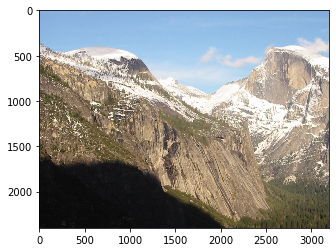

In [42]:
img = cv2.imread(path + '/yosemite/Yosemite1.jpg')
bicubic_img = cv2.resize(img,None, fx =0.5, fy = 0.5, interpolation = cv2.INTER_CUBIC)
plt.imshow(cv2.cvtColor(lista_imagen_leida[i], cv2.COLOR_BGR2RGB))
representar_imagenes([bicubic_img], ["interpolada"])

## Ejercicio 2 Descriptores AKAZE

Detectar y extraer los **descriptores AKAZE** de OpenCV, usando para ello detectAndCompute() . Establecer las correspondencias existentes entre cada dos imágenes usando el objeto BFMatcher de OpenCV y los criterios de correspondencias “BruteForce+crossCheck y “Lowe-Average-2NN”. Mostrar ambas imágenes en un mismo canvas y pintar líneas de diferentes colores entre las coordenadas de los puntos en correspondencias. Mostrar en cada caso un máximo de 100 elegidas aleatoriamente.

In [0]:
def puntosAKAZE(imagen):
  akaze = cv2.AKAZE_create()
  kp = akaze.detect(imagen, None)
  kp, des = akaze.compute(imagen, kp)
  kp, des = akaze.detectAndCompute(imagen, None)
  return kp, des

In [0]:
def correspondencias_fuerza_bruta(des1, des2, crosscheck = True, sort=True):
  fuerza_bruta = cv2.BFMatcher(cv2.NORM_L2, crossCheck = crosscheck)
  corresp = fuerza_bruta.match(des1, des2)
  #Ordenamos las correspondencias por mejor distancia si así se indica en sort
  if(sort):
    corresp = sorted(corresp, key=lambda x:x.distance)
  return corresp

In [0]:
def correspondencias_lowe(des1, des2, crosscheck = True):
  fuerza_bruta = cv2.BFMatcher(cv2.NORM_L2, crossCheck = False)
  corresp = fuerza_bruta.knnMatch(des1, des2, k=2)
  #Entre las dos coincidencias nos quedamos con la mejor (menor distancia)
  mejores = []
  for m,n in corresp:
    if m.distance < 0.70 * n.distance:
      mejores.append([m])
  return mejores

In [0]:
def pintar_correspondencias(img1, img2, kp1, kp2, corresp):
  return cv2.drawMatches(img1, kp1, img2, kp2, corresp, None, flags=2)

In [0]:
def pintar_correspondencias_lowe(img1, img2, kp1, kp2, corresp):
  return cv2.drawMatchesKnn(img1, kp1, img2, kp2, corresp, None, flags=2)

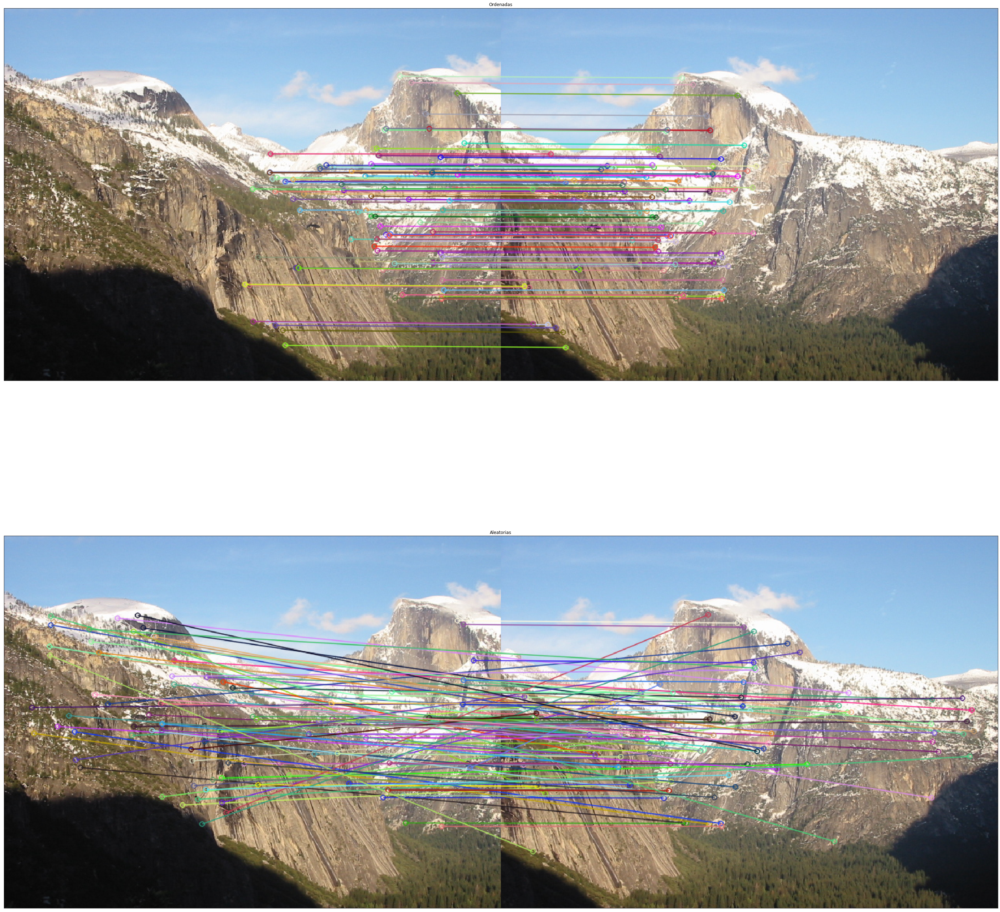

In [32]:
img1 = cv2.imread(path + '/yosemite/Yosemite1.jpg')
img2 = cv2.imread(path + '/yosemite/Yosemite2.jpg')
kp1, des1 = puntosAKAZE(img1)
kp2, des2 = puntosAKAZE(img2)
#Las 100 correspondencias más representativas
corresp_sort = correspondencias_fuerza_bruta(des1, des2)

img_sort = pintar_correspondencias(img1, img2, kp1, kp2, corresp_sort[0:100])
#100 correspondencias aleatorias
corresp_no_sort = correspondencias_fuerza_bruta(des1, des2, False)
img_not_sort = pintar_correspondencias(img1, img2, kp1, kp2, random.choices(corresp_no_sort, k=100))
representar_imagenes([img_sort, img_not_sort], ["Ordenadas", "Aleatorias"], 1, 50)

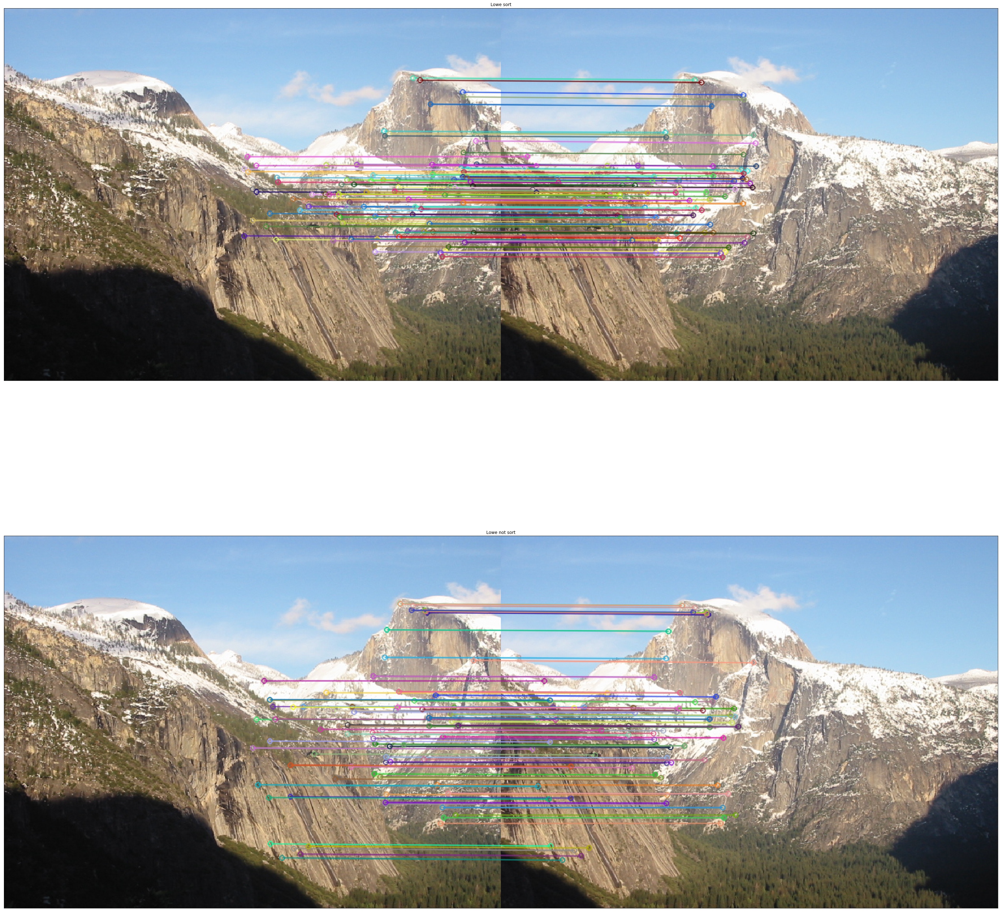

In [33]:
img1 = cv2.imread(path + '/yosemite/Yosemite1.jpg')
img2 = cv2.imread(path + '/yosemite/Yosemite2.jpg')
kp1, des1 = puntosAKAZE(img1)
kp2, des2 = puntosAKAZE(img2)
#Las 100 correspondencias más representativas
corresp = correspondencias_lowe(des1, des2)
img_sort= pintar_correspondencias_lowe(img1, img2, kp1, kp2, corresp[0:100])
img_not_sort = pintar_correspondencias_lowe(img1, img2, kp1, kp2, random.choices(corresp, k=100))
representar_imagenes([img_sort, img_not_sort], ["Lowe sort", "Lowe not sort"], 1, 50)

## Ejercicio 3

### Aproximación con 2 imágenes

In [0]:
def calcular_homografia(img_izq, img_der):
  #obtenemos los descriptores con el ejercicio anterior
  kp1, des1 = puntosAKAZE(img_izq)
  kp2, des2 = puntosAKAZE(img_der)
  #Las 100 correspondencias más representativas
  corresp = correspondencias_fuerza_bruta(des1, des2)
  p1 = np.float32([(kp1[c.queryIdx].pt) for c in corresp])
  p2 = np.float32([(kp2[c.trainIdx].pt) for c in corresp])
  H, mask = cv2.findHomography(p1, p2, cv2.RANSAC, 1.0)
  return H

In [0]:
def quitar_sobrante(imagen):
  #para la función boundingRect la imagen debe estar en escala de grises
  gris = cv2.cvtColor(imagen, cv2.COLOR_RGB2GRAY)
  x,y,w,h = cv2.boundingRect(gris)
  nueva = imagen[y:y+h,x:x+w]
  return nueva

In [0]:
def panorama2img (img_izq, img_der, quitar = True):
  #Calculamos el lienzo donde colocaremos las imágenes
  #Lo calcularemos obteniendo con el doble de los mayores anchos y alturas de ambas imágenes
  maxx = 0
  maxy = 0
  if(img_izq.shape[0]>img_der.shape[0]):
    maxy=img_izq.shape[0]
  else:
    maxy = img_der.shape[0]
  if(img_izq.shape[1]>img_der.shape[1]):
    maxx=img_izq.shape[1]
  else:
    maxx = img_der.shape[1]

  lienzo = [maxx*2, maxy*2]
  print(img_izq.shape[0])
  print(img_der.shape[0])
  print(maxy*2)
  print(img_izq.shape[1])
  print(img_der.shape[1])
  print(maxx*2)

  #construímos la homografía de traslación H0

  H0 = np.array([
                 [1., 0., (lienzo[0]/2)-(maxx/2)],
                 [0., 1., (lienzo[1]/2)-(maxy/2)],
                 [0., 0., 1.]
                 ])
  #H0=np.array([[1.,0.,(lienzo[0]/2)-(maxx/2)],[0.,1.,(lienzo[1]/2)-(maxy/2)],[0.,0.,1.]])
  #Colocamos la imagen izquierda en el lienzo con  H0
  H=np.eye(3)
  resultado = cv2.warpPerspective(img_izq, H0.dot(H),
                      (lienzo[0], lienzo[1]),
                      cv2.BORDER_TRANSPARENT)
  #Calculamos H, la homografía de img_der a img_izq
  H=H.dot(calcular_homografia(img_der, img_izq))

  #Aplicamos la homografía H
  cv2.warpPerspective(img_der, H0.dot(H),
                      (lienzo[0], lienzo[1]),
                      dst = resultado,
                      borderMode = cv2.BORDER_TRANSPARENT)

  if(quitar):
    resultado = quitar_sobrante(resultado)

  return resultado

In [0]:
img1 = cv2.imread(path + '/yosemite/Yosemite1.jpg')
img2 = cv2.imread(path + '/yosemite/Yosemite2.jpg')
resultado = panorama2img(img1, img2, False)
sin_negro = panorama2img(img1, img2)
representar_imagenes([resultado, sin_negro],["resultado", "sin fondo"])

### Aproximación n imágenes

In [0]:
def panorama_nimg(imagenes, quitar=True):
  maxx = 0
  maxy = 0
  centro = int(len(imagenes)/2)
  print(len(imagenes), "n imagenes")
  print(centro, "centro")
  for i in imagenes:
    if(i.shape[0]>maxy):
      maxy = i.shape[0]
    if (i.shape[1]>maxx):
      maxx = i.shape[1]
  
  lienzo = [maxx*(len(imagenes)), maxy*(len(imagenes))]

  #La homografía H0 que lleva la imagen al lienzo será la misma que con dos imágenes
  
  H0 = np.array([
                 [1., 0., (lienzo[0]/2)-(maxx/2)],
                 [0., 1., (lienzo[1]/2)-(maxy/2)],
                 [0., 0., 1.]
                 ])
  


  #H0=np.array([[1.,0.,(lienzo[0]/2)-(maxx/2)],[0.,1.,(lienzo[1]/2)-(maxy/2)],[0.,0.,1.]])

  H = np.eye(3)

  resultado = cv2.warpPerspective(imagenes[centro], H0.dot(H),
                                  (lienzo[0], lienzo[1]),
                                  cv2.BORDER_TRANSPARENT)
  
  #Crecimiento hacia la derecha
  for i in range(centro, len(imagenes)-1):
    print("homografia de ", i+1, " a ", i)
    H=H.dot(calcular_homografia(imagenes[i+1], imagenes[i]))
    cv2.warpPerspective(imagenes[i+1], H0.dot(H),
                        (lienzo[0], lienzo[1]),
                        dst = resultado,
                        borderMode = cv2.BORDER_TRANSPARENT)
    
  H=np.eye(3)
  #Crecimiento hacia la izquierda
  for i in range(centro, 0, -1):
    print("homografia de ", i-1, " a ", i)
    H=H.dot(calcular_homografia(imagenes[i-1], imagenes[i]))
    cv2.warpPerspective(imagenes[i-1], H0.dot(H),
                        (lienzo[0], lienzo[1]),
                        dst = resultado,
                        borderMode = cv2.BORDER_TRANSPARENT)
  
  if(quitar):
    resultado = quitar_sobrante(resultado)
  
  return resultado
  

In [0]:
imagenes = []
imagenes.append(cv2.imread(path + '/mosaico1/mosaico002.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico003.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico004.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico005.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico006.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico007.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico008.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico009.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico010.jpg'))
imagenes.append(cv2.imread(path + '/mosaico1/mosaico011.jpg'))

resultado = panorama_nimg(imagenes, True)
representar_imagenes([resultado], ["resultado"])


